# Low resolution simulation analyses SCF AVHRR

conda env: new `phd_v3` (in `envs/phd`)

Nudged simulations in wind at 6 hours and in temperature at 10 days, with released boundary layer. This configuration was chosen in order to compromise between not prescribing excessively the nudging close to the surface to let the ground-atmosphere coupling occur, while trying to minimize the biases of the model related to circulation and the tropospheric temperature bias observed.

Having a coupled simulation has the advantage of allowing snow-related feedbacks to emerge, while a forced ORCHIDEE simulation would largely prescribes snow. The coupling has of course advantages and disadvantages which are discussed in the article. More tests in forced version will of course be necessary with different forcing datasets to evaluate the uncertainty (however there is only a few data available over mountainous area and precipitation is often very uncertain).

Nudging is disabled in the "approximative" boundary layer (below 0.85 * surface pressure). It automatically adapts to the mountains (hybrid sigma-pressure levels; https://lmdz-forge.lmd.jussieu.fr/mediawiki/LMDZPedia/index.php/The_vertical_discretization_in_LMDZ), so for example if we are at 850 hPa at level 5 of the model when p_surf is 1000 hPa, we do not guide anywhere below level 5.

More information on nudging: 
- https://lmdz.lmd.jussieu.fr/le-coin-des-developpeurs/notes-techniques/ressources/guidage_LMDZ.pdf
- https://forge.ipsl.jussieu.fr/igcmg_doc/wiki/Doc/Models/LMDZ#Simulationwithnudging

More analyses of test simulations can be found here: https://github.com/mickaellalande/PhD/tree/master/Jean-Zay/SCA_parameterization/LMDZOR-STD

## Simulations 

- NY07: LMDZORnudge-uvt-6h-10d-noBL-STD-NY07-2004-2008
- R01: LMDZORnudge-uvt-6h-10d-noBL-STD-R01-2004-2008
- SL12: LMDZORnudge-uvt-6h-10d-noBL-STD-SL12-2004-2008
- LA22: LMDZORnudge-uvt-6h-10d-noBL-STD-LA22-2004-2008

## Path to simulations

- Jean-Zay WORK: `/gpfsdswork/projects/rech/goe/ufz23bm/SCA_parameterization/modipsl/config/LMDZOR_v6/`
- Jean-Zay STORE: `/gpfsstore/rech/goe/ufz23bm/IGCM_OUT/LMDZOR/DEVT/amip/`
- THREDDS: `/gpfsdsmnt/ipsl/dods/pub/ufz23bm/LMDZOR/DEVT/amip/`
- CICLAD: `/thredds/idris/work/ufz23bm/LMDZOR/DEVT/amip/` 
- local: `~/Dropbox/data/IGCM_OUT/LMDZOR/DEVT/amip/`
- https://vesg.ipsl.upmc.fr/thredds/catalog/idris_work/ufz23bm/LMDZOR/DEVT/amip/

## Import modules

In [1]:
# To reload external files automatically (ex: utils)
%load_ext autoreload
%autoreload 2

import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import proplot as plot # New plot library (https://proplot.readthedocs.io/en/latest/)
plot.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import xesmf as xe # For regridding (https://xesmf.readthedocs.io/en/latest/)
import calendar

import sys
sys.path.insert(1, '../utils') # to include my util file in previous directory
import utils as u # my personal functions
u.check_python_version()
u.check_virtual_memory()

import warnings
warnings.filterwarnings("ignore")

3.8.5 | packaged by conda-forge | (default, Jul 24 2020, 01:25:15) 
[GCC 7.5.0]
Virtual memory usage - total: 31 GB / available: 22 GB / percent used: 27.5 %


## Define paths

In [2]:
# root = '/thredds/idris/work/ufz23bm/LMDZOR/DEVT/amip/' # CICLAD
root = '/home/lalandmi/Dropbox/data/IGCM_OUT/LMDZOR/DEVT/amip/' # local

exp_NY07 = 'LMDZORnudge-uvt-6h-10d-noBL-STD-NY07-2004-2008'
exp_R01 = 'LMDZORnudge-uvt-6h-10d-noBL-STD-R01-2004-2008'
exp_SL12 = 'LMDZORnudge-uvt-6h-10d-noBL-STD-SL12-2004-2008'
exp_LA22 = 'LMDZORnudge-uvt-6h-10d-noBL-STD-LA22-2004-2008'

# 1 year spin-up
period = slice('2005', '2008')

## Load model data

In [3]:
scf_NY07 = xr.open_dataset(root+exp_NY07+'/SRF/Analyse/TS_MO/'+exp_NY07+'_20040101_20081231_1M_frac_snow.nc').frac_snow.rename({'time_counter': 'time'}).sortby('lat').sel(time=period)
scf_R01 = xr.open_dataset(root+exp_R01+'/SRF/Analyse/TS_MO/'+exp_R01+'_20040101_20081231_1M_frac_snow.nc').frac_snow.rename({'time_counter': 'time'}).sortby('lat').sel(time=period)
scf_SL12 = xr.open_dataset(root+exp_SL12+'/SRF/Analyse/TS_MO/'+exp_SL12+'_20040101_20081231_1M_frac_snow.nc').frac_snow.rename({'time_counter': 'time'}).sortby('lat').sel(time=period)
scf_LA22 = xr.open_dataset(root+exp_LA22+'/SRF/Analyse/TS_MO/'+exp_LA22+'_20040101_20081231_1M_frac_snow.nc').frac_snow.rename({'time_counter': 'time'}).sortby('lat').sel(time=period)

tas_NY07 = xr.open_dataset(root+exp_NY07+'/ATM/Analyse/TS_MO/'+exp_NY07+'_20040101_20081231_1M_t2m.nc').t2m.rename({'time_counter': 'time'}).sortby('lat').sel(time=period) - 273.15 # °C
tas_R01 = xr.open_dataset(root+exp_R01+'/ATM/Analyse/TS_MO/'+exp_R01+'_20040101_20081231_1M_t2m.nc').t2m.rename({'time_counter': 'time'}).sortby('lat').sel(time=period) - 273.15 # °C
tas_SL12 = xr.open_dataset(root+exp_SL12+'/ATM/Analyse/TS_MO/'+exp_SL12+'_20040101_20081231_1M_t2m.nc').t2m.rename({'time_counter': 'time'}).sortby('lat').sel(time=period) - 273.15 # °C
tas_LA22 = xr.open_dataset(root+exp_LA22+'/ATM/Analyse/TS_MO/'+exp_LA22+'_20040101_20081231_1M_t2m.nc').t2m.rename({'time_counter': 'time'}).sortby('lat').sel(time=period) - 273.15 # °C

pr_NY07 = xr.open_dataset(root+exp_NY07+'/ATM/Analyse/TS_MO/'+exp_NY07+'_20040101_20081231_1M_precip.nc').precip.rename({'time_counter': 'time'}).sortby('lat').sel(time=period) * 86400 # mm / day
pr_R01 = xr.open_dataset(root+exp_R01+'/ATM/Analyse/TS_MO/'+exp_R01+'_20040101_20081231_1M_precip.nc').precip.rename({'time_counter': 'time'}).sortby('lat').sel(time=period) * 86400 # mm / day
pr_SL12 = xr.open_dataset(root+exp_SL12+'/ATM/Analyse/TS_MO/'+exp_SL12+'_20040101_20081231_1M_precip.nc').precip.rename({'time_counter': 'time'}).sortby('lat').sel(time=period) * 86400 # mm / day
pr_LA22 = xr.open_dataset(root+exp_LA22+'/ATM/Analyse/TS_MO/'+exp_LA22+'_20040101_20081231_1M_precip.nc').precip.rename({'time_counter': 'time'}).sortby('lat').sel(time=period) * 86400 # mm / day

## Load observations

In [4]:
snc_MODIS_1deg = xr.open_mfdataset('/home/lalandmi/Dropbox/data/ESA_CCI_SNOW/preprocess/scfg/MODIS/v2.0/monthly_1deg/*.nc')['scfg_interp_1deg_icefilled'].sel(time=period)
snc_MODIS_1deg['time'] = scf_NY07.time
snc_AVHRR_1deg = xr.open_mfdataset('/home/lalandmi/Dropbox/data/ESA_CCI_SNOW/preprocess/scfg/AVHRR_MERGED/v2.0/monthly_1deg/*.nc')['scfg_interp_1deg_icefilled'].sel(time=period)
snc_AVHRR_1deg['time'] = scf_NY07.time
tas_CRU = xr.open_dataset('~/Dropbox/data/CRU/cru_ts4.00.1901.2015.tmp.dat.nc').tmp.sel(time=period)
tas_CRU['time'] = scf_NY07.time

## Regrid obs to model

In [5]:
regridder = xe.Regridder(snc_MODIS_1deg, scf_NY07, 'bilinear', periodic=True, reuse_weights=True)
snc_MODIS_1deg_regrid = regridder(snc_MODIS_1deg)
snc_AVHRR_1deg_regrid = regridder(snc_AVHRR_1deg)

regridder = xe.Regridder(tas_CRU, scf_NY07, 'bilinear', periodic=True, reuse_weights=True)
tas_CRU_regrid = regridder(tas_CRU)

Reuse existing file: bilinear_180x360_143x144_peri.nc
Reuse existing file: bilinear_360x720_143x144_peri.nc


## Load topo

In [6]:
grid_LR = xr.open_dataset('/home/lalandmi/Dropbox/data/IGCM_OUT/ELI-144x142x79-GMTED-STD-amip_2004_grilles_gcm.nc')

topo_LR = u.phys2dyn(xr.open_dataset('/home/lalandmi/Dropbox/data/IGCM_OUT/ELI-144x142x79-GMTED-STD-amip_2004_startphy.nc').ZMEA_NOT_FILTERED, grid_LR)
std_LR = u.phys2dyn(xr.open_dataset('/home/lalandmi/Dropbox/data/IGCM_OUT/ELI-144x142x79-GMTED-STD-amip_2004_startphy.nc').ZSTD_NOT_FILTERED, grid_LR)

# To have same lon from -180 to 180
regridder = xe.Regridder(topo_LR, scf_NY07, 'bilinear', periodic=True, reuse_weights=True)
topo_LR_regrid = regridder(topo_LR)
std_LR_regrid = regridder(std_LR)

Reuse existing file: bilinear_143x144_143x144_peri.nc


## Plot

In [9]:
lat_slice_HMA, lon_slice_HMA = u.get_domain_HMA()

# Zones
latlim_SA = slice(-60, -10); lonlim_SA = slice(-80, -60)
latlim_US = slice(20, 70); lonlim_US = slice(-165, -85)
latlim_EU = slice(30, 80); lonlim_EU = slice(0, 20)
latlim_HMA = slice(20, 55); lonlim_HMA = slice(60, 116)

In [10]:
snc_AVHRR_1deg_regrid_seas = snc_AVHRR_1deg_regrid.groupby('time.season').mean('time')

params = ['NY07', 'R01', 'SL12', 'LA22']
for i, da in enumerate([scf_NY07, scf_R01, scf_SL12, scf_LA22]):
    da.name = params[i]
    if i == 0:
        ds_scf_params = da.groupby('time.season').mean('time').to_dataset()
    else:
        ds_scf_params[params[i]] = da.groupby('time.season').mean('time')

In [11]:
def compute_metrics(model, obs):
    mb = (model-obs).weighted(np.cos(np.deg2rad(model.lat))).mean().values.item(0)
    rmse = np.sqrt(((model-obs)**2).weighted(np.cos(np.deg2rad(model.lat))).mean().values.item(0))
    
    x = model.where(obs*0 == 0).values.flatten(); y = obs.where(model*0 == 0).values.flatten()
    x = x[~np.isnan(x)]; y = y[~np.isnan(y)]
    r = stats.pearsonr(x, y)
    
    return mb, rmse, r

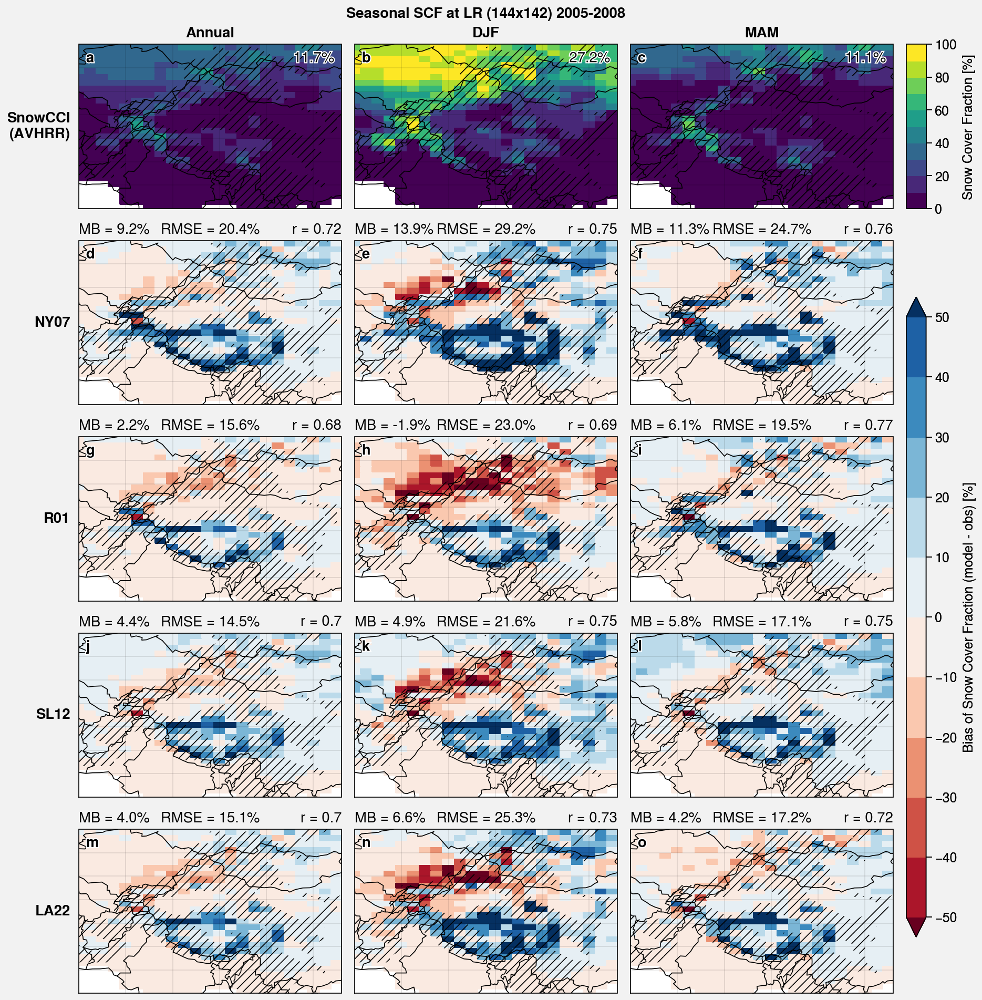

In [12]:
fig, axs = plot.subplots(ncols = 3, nrows = 5, proj='cyl', axwidth=2.5)

cmap = 'viridis'
levels = plot.arange(0, 100, 10)

cmap_bias = 'RdBu'
levels_bias = plot.arange(-50, 50, 10)
extend_bias = 'both'

threshold = 200 # STD

obs = snc_AVHRR_1deg_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA).mean('season')
m = axs[0].pcolormesh(snc_AVHRR_1deg_regrid_seas.mean('season'), cmap=cmap, levels=levels)
mean = obs.where(std_LR_regrid > threshold).weighted(np.cos(np.deg2rad(obs.lat))).mean().values.item(0)
axs[0].format(urtitle='{:.1f}%'.format(mean))

obs = snc_AVHRR_1deg_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA, season='DJF')
axs[1].pcolormesh(obs, cmap=cmap, levels=levels)
mean = obs.where(std_LR_regrid > threshold).weighted(np.cos(np.deg2rad(obs.lat))).mean().values.item(0)
axs[1].format(urtitle='{:.1f}%'.format(mean))

obs = snc_AVHRR_1deg_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA, season='MAM')
axs[2].pcolormesh(obs, cmap=cmap, levels=levels)
mean = obs.where(std_LR_regrid > threshold).weighted(np.cos(np.deg2rad(obs.lat))).mean().values.item(0)
axs[2].format(urtitle='{:.1f}%'.format(mean))

k = 3
for param in params:
    # Annual
    model = ds_scf_params[param].sel(lat=latlim_HMA, lon=lonlim_HMA).mean('season')
    obs = snc_AVHRR_1deg_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA).mean('season')
    m_bias = axs[k].pcolormesh(model - obs, cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
    mb, rmse, (r, _) = compute_metrics(model.where(std_LR_regrid > threshold), obs.where(std_LR_regrid > threshold))
    axs[k].format(ltitle='MB = {:.1f}%'.format(mb), ctitle='RMSE = {:.1f}%'.format(rmse), rtitle='r = {:.2}'.format(r))
    
    # DJF
    model = ds_scf_params[param].sel(lat=latlim_HMA, lon=lonlim_HMA, season='DJF')
    obs = snc_AVHRR_1deg_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA, season='DJF')
    axs[k+1].pcolormesh(model - obs, cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
    mb, rmse, (r, _) = compute_metrics(model.where(std_LR_regrid > threshold), obs.where(std_LR_regrid > threshold))
    axs[k+1].format(ltitle='MB = {:.1f}%'.format(mb), ctitle='RMSE = {:.1f}%'.format(rmse), rtitle='r = {:.2}'.format(r))
    
    # MAM
    model = ds_scf_params[param].sel(lat=latlim_HMA, lon=lonlim_HMA, season='MAM')
    obs = snc_AVHRR_1deg_regrid_seas.sel(lat=latlim_HMA, lon=lonlim_HMA, season='MAM')
    axs[k+2].pcolormesh(model - obs, cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
    mb, rmse, (r, _) = compute_metrics(model.where(std_LR_regrid > threshold), obs.where(std_LR_regrid > threshold))
    axs[k+2].format(ltitle='MB = {:.1f}%'.format(mb), ctitle='RMSE = {:.1f}%'.format(rmse), rtitle='r = {:.2}'.format(r))
    
    k += 3
    
for ax in axs:
#     ax.contour(std_LR_regrid, levels=[200], color='red')
    ax.contourf(std_LR_regrid.where(std_LR_regrid > threshold), hatches=['////'], alpha=0)

fig.colorbar(m, label='Snow Cover Fraction [%]', row=1)
fig.colorbar(m_bias, label='Bias of Snow Cover Fraction (model - obs) [%]', rows=(2,5), length=0.85)

axs.format(
    latlim=(latlim_HMA.start, latlim_HMA.stop), lonlim=(lonlim_HMA.start, lonlim_HMA.stop),
    collabels = ['Annual', 'DJF', 'MAM'],
    rowlabels = ['SnowCCI\n(AVHRR)'] + params,
    borders=True, coast=True, labels=False, 
    abc=True, abcloc='ul',
    suptitle='Seasonal SCF at LR (144x142) '+str(period.start)+'-'+str(period.stop) 
)

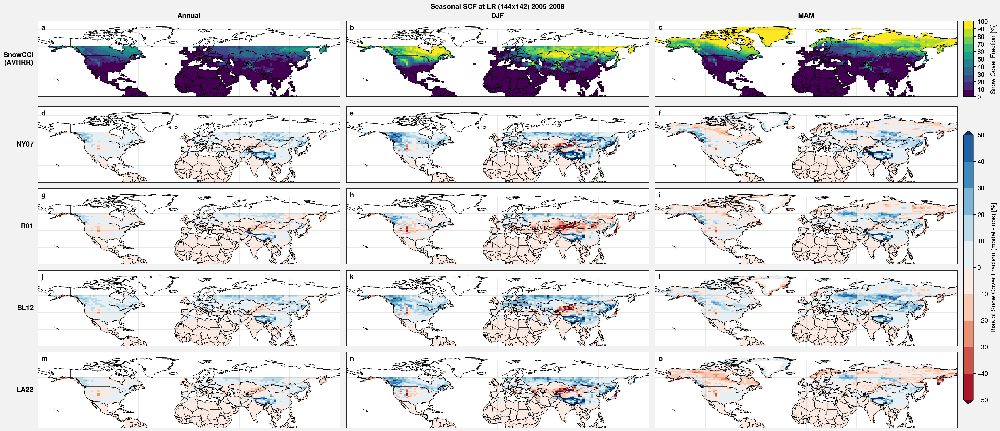

In [15]:
fig, axs = plot.subplots(ncols = 3, nrows = 5, proj='cyl', axwidth=6)

cmap = 'viridis'
levels = plot.arange(0, 100, 10)

cmap_bias = 'RdBu'
levels_bias = plot.arange(-50, 50, 10)
extend_bias = 'both'

m = axs[0].pcolormesh(snc_AVHRR_1deg_regrid_seas.mean('season').where(snc_AVHRR_1deg_regrid_seas.lat < 60), cmap=cmap, levels=levels)
axs[1].pcolormesh(snc_AVHRR_1deg_regrid_seas.sel(season='DJF').where(snc_AVHRR_1deg_regrid_seas.lat < 60), cmap=cmap, levels=levels)
axs[2].pcolormesh(snc_AVHRR_1deg_regrid_seas.sel(season='MAM'), cmap=cmap, levels=levels)

k = 3
for param in params:
    m_bias = axs[k].pcolormesh(ds_scf_params[param].mean('season').where(snc_AVHRR_1deg_regrid_seas.lat < 60) - snc_AVHRR_1deg_regrid_seas.mean('season'), cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
    axs[k+1].pcolormesh(ds_scf_params[param].sel(season='DJF').where(snc_AVHRR_1deg_regrid_seas.lat < 60) - snc_AVHRR_1deg_regrid_seas.sel(season='DJF'), cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
    axs[k+2].pcolormesh(ds_scf_params[param].sel(season='MAM') - snc_AVHRR_1deg_regrid_seas.sel(season='MAM'), cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
#     axs[k+1].pcolormesh(ds_scf_params[param].sel(season='JJA') - snc_AVHRR_1deg_regrid_seas.sel(season='JJA'), cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
#     axs[k+2].pcolormesh(ds_scf_params[param].sel(season='SON') - snc_AVHRR_1deg_regrid_seas.sel(season='SON'), cmap=cmap_bias, levels=levels_bias, extend=extend_bias)
    k += 3

fig.colorbar(m, label='Snow Cover Fraction [%]', row=1)
fig.colorbar(m_bias, label='Bias of Snow Cover Fraction (model - obs) [%]', rows=(2,5), length=0.85)

axs.format(
    latlim=(0, 90),
    collabels = ['Annual', 'DJF', 'MAM'],
    rowlabels = ['SnowCCI\n(AVHRR)'] + params,
    borders=True, coast=True, labels=False, 
    abc=True, abcloc='ul',
    suptitle='Seasonal SCF at LR (144x142) '+str(period.start)+'-'+str(period.stop) 
)

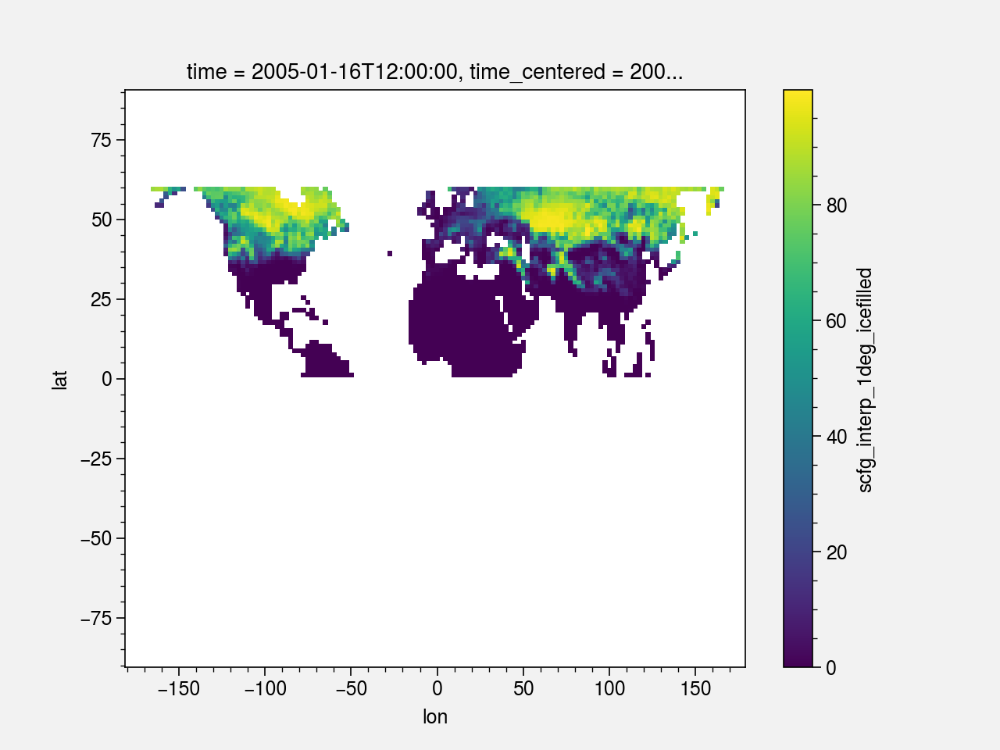

In [16]:
snc_AVHRR_1deg_regrid.where( (snc_AVHRR_1deg_regrid.lat > 0) & (snc_AVHRR_1deg_regrid.lat < 60) )[0].plot()

In [23]:
ts_MODIS_NH_mountain = u.spatial_average(snc_MODIS_1deg_regrid.groupby('time.month').mean().where( (snc_MODIS_1deg_regrid.lat > 0) & (snc_MODIS_1deg_regrid.lat < 60) ).where(std_LR_regrid > 200))
ts_AVHRR_NH_mountain = u.spatial_average(snc_AVHRR_1deg_regrid.groupby('time.month').mean().where( (snc_AVHRR_1deg_regrid.lat > 0) & (snc_AVHRR_1deg_regrid.lat < 60) ).where(std_LR_regrid > 200))

params = ['NY07', 'R01', 'SL12', 'LA22']
for i, da in enumerate([scf_NY07, scf_R01, scf_SL12, scf_LA22]):
    ts = u.spatial_average(da.where(snc_AVHRR_1deg_regrid*0 == 0).groupby('time.month').mean().where( (da.lat > 0) & (da.lat < 60) ).where(std_LR_regrid > 200))
    ts.name = params[i]
    
    rmse = np.sqrt(u.spatial_average((snc_AVHRR_1deg_regrid.groupby('time.month').mean().where( (snc_MODIS_1deg_regrid.lat > 0) & (snc_MODIS_1deg_regrid.lat < 60) ).where(std_LR_regrid > 200) - \
            da.where(snc_AVHRR_1deg_regrid*0 == 0).groupby('time.month').mean().where( (da.lat > 0) & (da.lat < 60) ).where(std_LR_regrid > 200))**2))
    rmse.name = params[i]
    
    if i == 0:
        ds_NH_mountain = ts.to_dataset()
        ds_NH_mountain_rmse = rmse.to_dataset()
    
    ds_NH_mountain[params[i]] = ts
    ds_NH_mountain_rmse[params[i]] = rmse

In [24]:
ts_MODIS_NH_flat = u.spatial_average(snc_MODIS_1deg_regrid.groupby('time.month').mean().where( (snc_MODIS_1deg_regrid.lat > 0) & (snc_MODIS_1deg_regrid.lat < 60) ).where(std_LR_regrid < 200))
ts_AVHRR_NH_flat = u.spatial_average(snc_AVHRR_1deg_regrid.groupby('time.month').mean().where( (snc_AVHRR_1deg_regrid.lat > 0) & (snc_AVHRR_1deg_regrid.lat < 60) ).where(std_LR_regrid < 200))

params = ['NY07', 'R01', 'SL12', 'LA22']
for i, da in enumerate([scf_NY07, scf_R01, scf_SL12, scf_LA22]):
    ts = u.spatial_average(da.where(snc_AVHRR_1deg_regrid*0 == 0).groupby('time.month').mean().where( (da.lat > 0) & (da.lat < 60) ).where(std_LR_regrid < 200))
    ts.name = params[i]
    
    rmse = np.sqrt(u.spatial_average((snc_AVHRR_1deg_regrid.groupby('time.month').mean().where( (snc_MODIS_1deg_regrid.lat > 0) & (snc_MODIS_1deg_regrid.lat < 60) ).where(std_LR_regrid < 200) - \
            da.where(snc_AVHRR_1deg_regrid*0 == 0).groupby('time.month').mean().where( (da.lat > 0) & (da.lat < 60) ).where(std_LR_regrid < 200))**2))
    rmse.name = params[i]
    
    if i == 0:
        ds_NH_flat = ts.to_dataset()
        ds_NH_flat_rmse = rmse.to_dataset()
    
    ds_NH_flat[params[i]] = ts
    ds_NH_flat_rmse[params[i]] = rmse

In [25]:
params = ['NY07', 'R01', 'SL12', 'LA22']
zones = ['US', 'EU', 'SA', 'HMA']
ds_list_MODIS = [None]*len(zones)
ds_list_AVHRR = [None]*len(zones)
ds_list = [None]*len(zones)
ds_list_rmse = [None]*len(zones)
for i, da in enumerate([scf_NY07, scf_R01, scf_SL12, scf_LA22]):
    
    for i_zone, (latlim, lonlim) in enumerate(zip([latlim_US, latlim_EU, latlim_SA, latlim_HMA], [lonlim_US, lonlim_EU, lonlim_SA, lonlim_HMA])):
        ds_list_MODIS[i_zone] = u.spatial_average(snc_MODIS_1deg_regrid.groupby('time.month').mean().where( (snc_MODIS_1deg_regrid.lat > -60) & (snc_MODIS_1deg_regrid.lat < 60) ).where(std_LR_regrid > 200).sel(lat=latlim, lon=lonlim))
        ds_list_AVHRR[i_zone] = u.spatial_average(snc_AVHRR_1deg_regrid.groupby('time.month').mean().where( (snc_AVHRR_1deg_regrid.lat > -60) & (snc_AVHRR_1deg_regrid.lat < 60) ).where(std_LR_regrid > 200).sel(lat=latlim, lon=lonlim))
        
        ts = u.spatial_average(da.where(snc_AVHRR_1deg_regrid*0 == 0).groupby('time.month').mean().where( (da.lat > -60) & (da.lat < 60) ).where(std_LR_regrid > 200).sel(lat=latlim, lon=lonlim))
        ts.name = params[i]

        rmse = np.sqrt(u.spatial_average((snc_AVHRR_1deg_regrid.groupby('time.month').mean().where( (snc_AVHRR_1deg_regrid.lat > -60) & (snc_AVHRR_1deg_regrid.lat < 60) ).where(std_LR_regrid > 200).sel(lat=latlim, lon=lonlim) - \
                da.where(snc_AVHRR_1deg_regrid*0 == 0).groupby('time.month').mean().where( (da.lat > -60) & (da.lat < 60) ).where(std_LR_regrid > 200).sel(lat=latlim, lon=lonlim))**2))
        rmse.name = params[i]

        if i == 0:
            ds_list[i_zone] = ts.to_dataset()
            ds_list_rmse[i_zone] = rmse.to_dataset()

        ds_list[i_zone][params[i]] = ts
        ds_list_rmse[i_zone][params[i]] = rmse

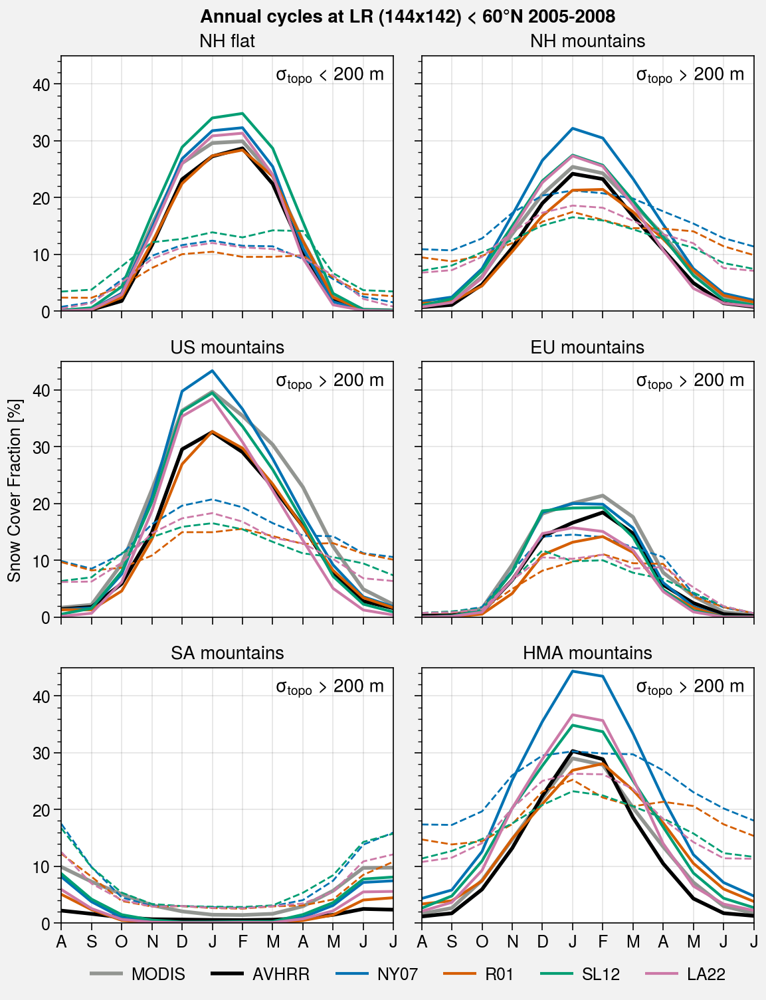

In [26]:
zones = ['US', 'EU', 'SA', 'HMA']

fig, axs = plot.subplots(ncols = 2, nrows = 3, aspect=1.3)
roll = 5
ylim = (0, 45)

# Flat NH
axs[0].plot(ts_MODIS_NH_flat.roll(month=roll).values, color='gray', label='MODIS', lw=2)
axs[0].plot(ts_AVHRR_NH_flat.roll(month=roll).values, color='k', label='AVHRR', lw=2)
for i, param in enumerate(params):
    axs[0].plot(ds_NH_flat[param].roll(month=roll).values, label=param, color='C'+str(i))
    axs[0].plot(ds_NH_flat_rmse[param].roll(month=roll).values, ls='--', color='C'+str(i), lw=1)
    
axs[0].format(title='NH flat', urtitle='$\sigma_{topo}$ < 200 m')

# Mountain NH
axs[1].plot(ts_MODIS_NH_mountain.roll(month=roll).values, color='gray', lw=2)
axs[1].plot(ts_AVHRR_NH_mountain.roll(month=roll).values, color='k', lw=2)
for i, param in enumerate(params):
    axs[1].plot(ds_NH_mountain[param].roll(month=roll).values, color='C'+str(i))
    axs[1].plot(ds_NH_mountain_rmse[param].roll(month=roll).values, ls='--', color='C'+str(i), lw=1)
    
axs[1].format(title='NH mountains', urtitle='$\sigma_{topo}$ > 200 m')

# Mountain zones
for i, zone in enumerate(zones):
    axs[i+2].plot(ds_list_MODIS[i].roll(month=roll).values, color='gray', lw=2)
    axs[i+2].plot(ds_list_AVHRR[i].roll(month=roll).values, color='k', lw=2)
    for i_param, param in enumerate(params):
        axs[i+2].plot(ds_list[i][param].roll(month=roll).values, color='C'+str(i_param))
        axs[i+2].plot(ds_list_rmse[i][param].roll(month=roll).values, ls='--', color='C'+str(i_param), lw=1)

    axs[i+2].format(title=zone+' mountains', urtitle='$\sigma_{topo}$ > 200 m')
    
for ax in axs:
    ax.autoscale(tight=True)
    
axs.format(
    xlocator='index', xformatter=[calendar.month_abbr[i][0] for i in ds_NH_mountain[param].roll(month=roll).month.values], xtickminor=False,
    ylabel='Snow Cover Fraction [%]', ylim=ylim,
    suptitle='Annual cycles at LR (144x142) < 60°N '+str(period.start)+'-'+str(period.stop)
)

fig.legend(loc='b', frame=False, ncols=6, order='F', center=False)

### Taylor diagram sur TS

In [27]:
column_indexes = [['LR', 'HR'], ['MODIS', 'AVHRR', 'NY07', 'R01', 'SL12', 'LA22']]
columns = pd.MultiIndex.from_product(column_indexes)

zones = ['NH_flat', 'NH_mount', 'US_mount', 'EU_mount', 'SA_mount', 'HMA_mount']
row_indexes = [zones, ['mb', 'rmse', 'r', 'std']]
rows = pd.MultiIndex.from_product(row_indexes)

df_metrics = pd.DataFrame(index=rows, columns=columns)
df_metrics

LR                              HR                          
               MODIS AVHRR NY07  R01 SL12 LA22 MODIS AVHRR NY07  R01 SL12 LA22
NH_flat   mb     NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          rmse   NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          r      NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          std    NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
NH_mount  mb     NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          rmse   NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          r      NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          std    NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
US_mount  mb     NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          rmse   NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          r      NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          std    NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
EU_mount  mb     NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          rmse   NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          r      NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          std    NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
SA_mount  mb     NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          rmse   NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          r      NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          std    NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
HMA_mount mb     NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          rmse   NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          r      NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN
          std    NaN   NaN  NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN  NaN  NaN

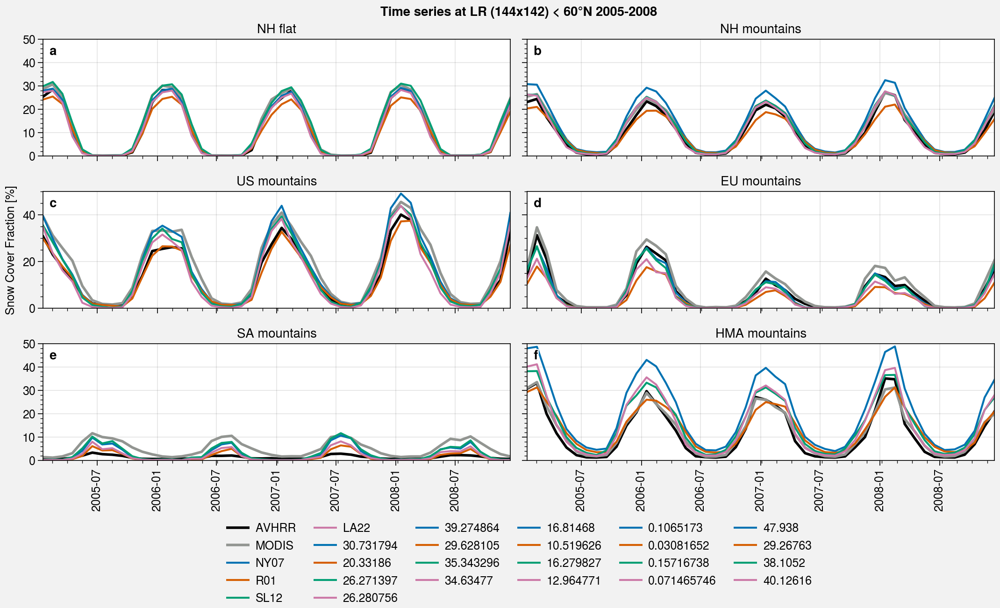

In [28]:
zones = ['NH_flat', 'NH_mount', 'US_mount', 'EU_mount', 'SA_mount', 'HMA_mount']
titles = ['NH flat', 'NH mountains', 'US mountains', 'EU mountains', 'SA mountains', 'HMA mountains']
latlim_zones = [slice(0, 90), slice(0, 90), latlim_US, latlim_EU, latlim_SA, latlim_HMA]
lonlim_zones = [slice(None), slice(None), lonlim_US, lonlim_EU, lonlim_SA, lonlim_HMA]

fig, axs = plot.subplots(nrows=3, ncols=2, axwidth=5, aspect=4)

list_scf = [snc_AVHRR_1deg_regrid, snc_MODIS_1deg_regrid, scf_NY07, scf_R01, scf_SL12, scf_LA22]
labels = ['AVHRR', 'MODIS', 'NY07', 'R01', 'SL12', 'LA22']

for i, (zone, latlim, lonlim) in enumerate(zip(zones, latlim_zones, lonlim_zones)):
    
    if i == 0:
        cond_std = (std_LR_regrid < 200)
    else:
        cond_std = (std_LR_regrid > 200)
        
    cond_area = ( (snc_AVHRR_1deg_regrid.lat > -60) & (snc_AVHRR_1deg_regrid.lat < 60) )
    
    ts_ref = u.spatial_average(snc_AVHRR_1deg_regrid.where(cond_std).where(cond_area).sel(lat=latlim, lon=lonlim))
    
    for j, da in enumerate(list_scf):
        ts = u.spatial_average(da.where(cond_std).where(cond_area).sel(lat=latlim, lon=lonlim))
        if i == 0:
            if j == 0:
                axs[i].plot(ts, label=labels[j], color='k', lw=2)
            elif j == 1:
                axs[i].plot(ts, label=labels[j], color='gray', lw=2)
            else:
                axs[i].plot(ts, label=labels[j])
        else:
            if j == 0:
                axs[i].plot(ts, color='k', lw=2)
            elif j == 1:
                axs[i].plot(ts, color='gray', lw=2)
            else:
                axs[i].plot(ts)
            
        # Compute metrics
        mb = (ts - ts_ref).mean().values.item(0)
        rmse = np.sqrt( ( (ts - ts_ref)**2 ).mean().values.item(0) )
        r = stats.pearsonr(ts, ts_ref)[0]
        std = ts.std().values.item(0)

        df_metrics.loc[(zone), ('LR', labels[j])]  = [mb, rmse, r, std]
            

for i, ax in enumerate(axs):
    ax.autoscale(tight=True)
    ax.format(title=titles[i])

axs.format(
#     collabels=['not optimized', '', 'optimized', ''],
#     rowlabels=zones,
    abc=True, abcloc='ul',
    ylim=(0, 50), ylabel='Snow Cover Fraction [%]', xlabel='',
    suptitle='Time series at LR (144x142) < 60°N '+str(period.start)+'-'+str(period.stop)
)

fig.legend(loc='b', frame=False, ncols=6, order='F', center=False)

# fig.save('img/timeseries_ac_1deg.jpg')

In [69]:
df_metrics

LR                                                      \
                  MODIS     AVHRR      NY07       R01        SL12      LA22   
NH_flat   mb          0  -1.23787 -0.996179   -2.1027    0.476625  -1.52934   
          rmse        0   1.70169   1.35504   3.06225    0.938757   2.01336   
          r           1  0.996846  0.997923  0.995343    0.997872  0.996261   
          std   11.7228   10.9802   11.1755    9.7501      11.962   10.8489   
NH_mount  mb          0  -1.34507   1.96309  -1.90967 -0.00547488 -0.780716   
          rmse        0   1.63442   2.62927   2.81913    0.724136   1.51117   
          r           1  0.995081  0.997127  0.993098    0.996887  0.990325   
          std   8.88428   8.54482   10.4732   7.02997     9.04011   9.19098   
US_mount  mb          0  -4.47969  -1.32956  -5.29063    -2.85143  -4.47461   
          rmse        0   5.36888    2.6757   6.35491     3.49203    5.3697   
          r           1  0.990102  0.988702  0.988753    0.990034  0.978259   
          std   14.2165   11.8904   14.9782   11.2507     13.8402   13.5628   
EU_mount  mb          0  -1.72624  -2.14133  -4.25538    -2.44275  -3.59604   
          rmse        0   2.24313   2.85435   5.92417     3.28985   4.92281   
          r           1  0.996027  0.991795  0.989166    0.985357   0.98732   
          std   9.14941   7.93497   7.59316   5.15367     7.45902   6.00138   
SA_mount  mb          0  -3.76591  -2.37187  -3.50912    -2.01295  -3.09078   
          rmse        0   4.58304    2.6179   3.88763     2.27058   3.39129   
          r           1  0.962143  0.943123  0.936428    0.950021  0.936289   
          std   3.33281  0.757736   3.14023   1.92413     3.31125   2.36044   
HMA_mount mb          0  -0.91503   8.22537   1.28522     3.42849   3.03939   
          rmse        0   1.79852    9.5875   2.45129     3.99121   4.41701   
          r           1  0.991306   0.99491   0.98058    0.994715   0.99163   
          std   9.93053   10.6749   14.7031   8.98672     11.6488   12.7848   

                  HR                            
               MODIS AVHRR NY07  R01 SL12 LA22  
NH_flat   mb     NaN   NaN  NaN  NaN  NaN  NaN  
          rmse   NaN   NaN  NaN  NaN  NaN  NaN  
          r      NaN   NaN  NaN  NaN  NaN  NaN  
          std    NaN   NaN  NaN  NaN  NaN  NaN  
NH_mount  mb     NaN   NaN  NaN  NaN  NaN  NaN  
          rmse   NaN   NaN  NaN  NaN  NaN  NaN  
          r      NaN   NaN  NaN  NaN  NaN  NaN  
          std    NaN   NaN  NaN  NaN  NaN  NaN  
US_mount  mb     NaN   NaN  NaN  NaN  NaN  NaN  
          rmse   NaN   NaN  NaN  NaN  NaN  NaN  
          r      NaN   NaN  NaN  NaN  NaN  NaN  
          std    NaN   NaN  NaN  NaN  NaN  NaN  
EU_mount  mb     NaN   NaN  NaN  NaN  NaN  NaN  
          rmse   NaN   NaN  NaN  NaN  NaN  NaN  
          r      NaN   NaN  NaN  NaN  NaN  NaN  
          std    NaN   NaN  NaN  NaN  NaN  NaN  
SA_mount  mb     NaN   NaN  NaN  NaN  NaN  NaN  
          rmse   NaN   NaN  NaN  NaN  NaN  NaN  
          r      NaN   NaN  NaN  NaN  NaN  NaN  
          std    NaN   NaN  NaN  NaN  NaN  NaN  
HMA_mount mb     NaN   NaN  NaN  NaN  NaN  NaN  
          rmse   NaN   NaN  NaN  NaN  NaN  NaN  
          r      NaN   NaN  NaN  NaN  NaN  NaN  
          std    NaN   NaN  NaN  NaN  NaN  NaN

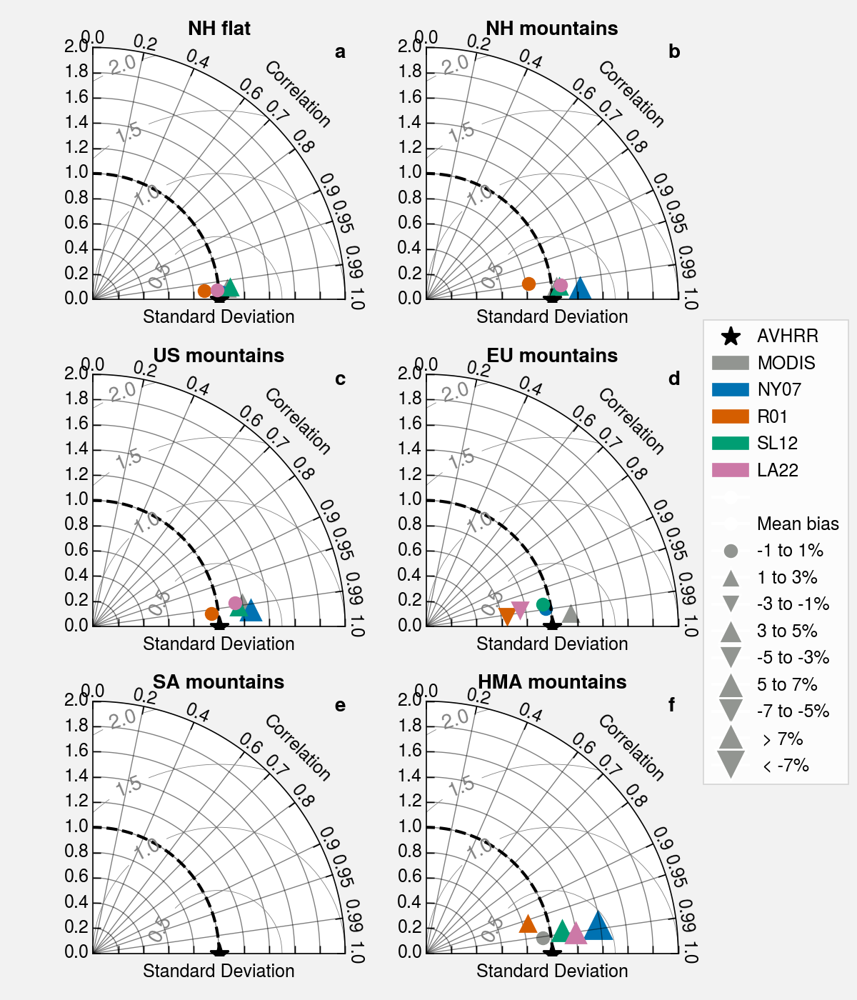

In [29]:
import string 

abc = list(string.ascii_lowercase)
srange = [(0, 1.7), (0, 4.4)]

labels = ['MODIS', 'NY07', 'R01', 'SL12', 'LA22']
titles = ['NH flat', 'NH mountains', 'US mountains', 'EU mountains', 'SA mountains', 'HMA mountains']
colors = ['gray', 'C0', 'C1', 'C2', 'C3']

fig = plt.figure(figsize=(6,7))

k = 1

for i_zone, zone in enumerate(zones):
    std_ref = df_metrics['LR', 'AVHRR'].loc[zone, 'std']
    dia = u.TaylorDiagram(1, fig=fig, rect='32'+str(k), label='AVHRR', srange=(0, 2), extend=False)

    for i, label in enumerate(labels):
        bias = df_metrics['LR', label].loc[zone, 'mb']
        if bias > 1:
            marker = '^'
        elif bias < -1:
            marker = 'v'
        else:
            marker = 'o'

        if np.abs(bias) < 1:
            markersize = 6
        elif np.abs(bias) < 3:
            markersize = 8
        elif np.abs(bias) < 5:
            markersize = 10
        elif np.abs(bias) < 7:
            markersize = 12
        else:
            markersize = 14

        dia.add_sample(
            df_metrics['LR', label].loc[zone, 'std']/std_ref, 
            df_metrics['LR', label].loc[zone, 'r'], 
            marker=marker, markersize=markersize,
            ms=10, ls='', mfc=colors[i], mec=colors[i], label=label, zorder=i
        )

        dia._ax.set_title(titles[i_zone], fontweight="bold")

    dia._ax.text(0.95, 0.95, abc[k-1], size=10, weight='bold', transform=dia._ax.transAxes)
    dia._ax.axis["left"].toggle(ticklabels=False)

    # Add RMS contours, and label them + grid
    contours = dia.add_contours(levels=4, colors='0.5', linewidths=0.3)  # 5 levels in grey
    plt.clabel(contours, inline=1, fontsize=10, fmt='%.1f')
    dia._ax.grid(lw=0.5, alpha=0.5)

    k += 1

from matplotlib.patches import Patch
from matplotlib.lines import Line2D
legend_handles = [dia.samplePoints[0]]
for color, label in zip(colors, labels):     
    legend_handles.append(Patch(facecolor=color, edgecolor=color, label=label))
    
# Bias
legend_handles.append(Line2D([0], [0], marker='o', color='w', label='', markerfacecolor='w', markersize=6))
legend_handles.append(Line2D([0], [0], marker='o', color='w', label='Mean bias', markerfacecolor='w', markersize=6))
legend_handles.append(Line2D([0], [0], marker='o', color='w', label='-1 to 1%', markerfacecolor='gray', markersize=6+2))
legend_handles.append(Line2D([0], [0], marker='^', color='w', label='1 to 3%', markerfacecolor='gray', markersize=8+2))
legend_handles.append(Line2D([0], [0], marker='v', color='w', label='-3 to -1%', markerfacecolor='gray', markersize=8+2))
legend_handles.append(Line2D([0], [0], marker='^', color='w', label='3 to 5%', markerfacecolor='gray', markersize=10+2))
legend_handles.append(Line2D([0], [0], marker='v', color='w', label='-5 to -3%', markerfacecolor='gray', markersize=10+2))
legend_handles.append(Line2D([0], [0], marker='^', color='w', label='5 to 7%', markerfacecolor='gray', markersize=12+2))
legend_handles.append(Line2D([0], [0], marker='v', color='w', label='-7 to -5%', markerfacecolor='gray', markersize=12+2))
legend_handles.append(Line2D([0], [0], marker='^', color='w', label=' > 7%', markerfacecolor='gray', markersize=14+2))
legend_handles.append(Line2D([0], [0], marker='v', color='w', label=' < -7%', markerfacecolor='gray', markersize=14+2))
    
fig.legend(handles=legend_handles, ncol=1, bbox_to_anchor=(0.99, 0.68))        
fig.tight_layout(rect=[0.05, 0, 0.85, 1])
# fig.savefig('img/taylor_diagrams_validation.jpg', dpi=300)

### Spatial plots

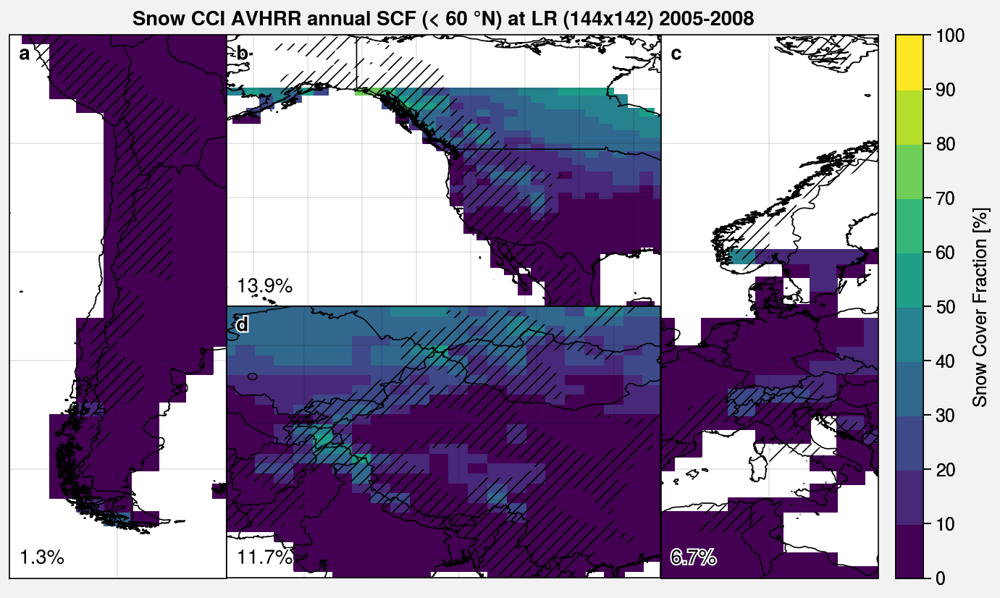

In [31]:
fig, axs = plot.subplots([[1, 2, 2, 3], [1, 4, 4, 3]], proj='cyl', space=0, axwidth=1.5)

da = snc_AVHRR_1deg_regrid_seas.mean('season').where(snc_AVHRR_1deg_regrid_seas.lat < 60)
cmap = 'viridis'
levels = plot.arange(0, 100, 10)

threshold = 200 # STD

for i, (latlim, lonlim) in enumerate(zip([latlim_SA, latlim_US, latlim_EU, latlim_HMA], [lonlim_SA, lonlim_US, lonlim_EU, lonlim_HMA])):
    obs = da.sel(lat=latlim, lon=lonlim)
    m = axs[i].pcolormesh(obs, cmap=cmap, levels=levels)
    mean = (u.spatial_average(obs.where(std_LR_regrid > threshold))).values.item(0)
    axs[i].format(
        latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
        lltitle='{:.1f}%'.format(mean)
    )


fig.colorbar(m, label='Snow Cover Fraction [%]', ticks=10)

for ax in axs:
    ax.contourf(std_LR_regrid.where(std_LR_regrid > threshold), hatches=['////'], alpha=0)

axs.format(
    lonlines=10, latlines=10,
    suptitle='Snow CCI AVHRR annual SCF (< 60 °N) at LR (144x142) '+str(period.start)+'-'+str(period.stop),
    coast=True, borders=True,
#     ocean=True, oceancolor='pale blue',
    abc=True, abcloc='ul', reso='hi'
)

# fig.save('img/snowCCI_MODIS_annual_coverage_'+str(pd.to_datetime(period.start))[:10]+'_'+str(ds.time[-1].values)[:10]+'.jpg')

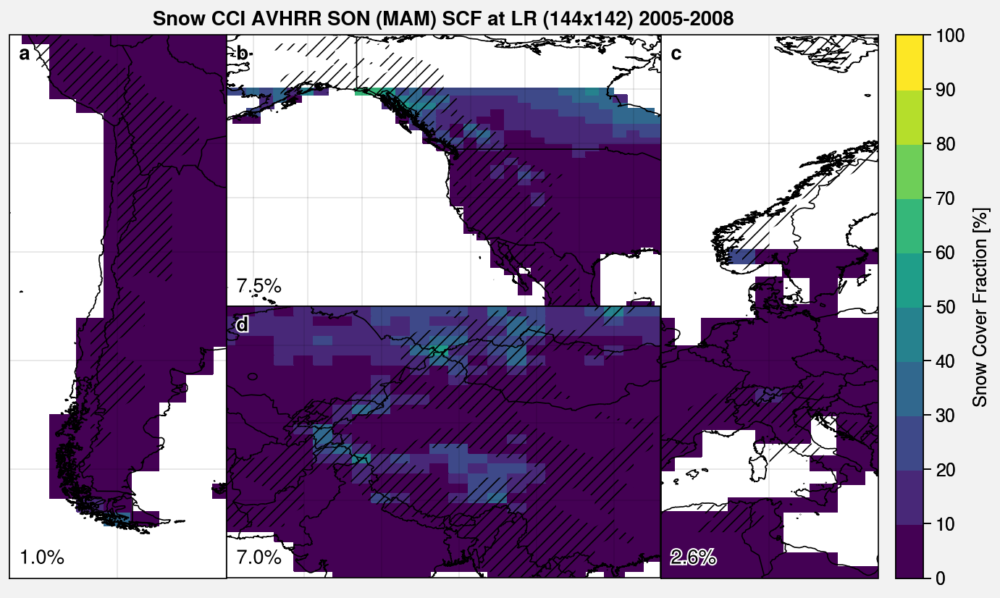

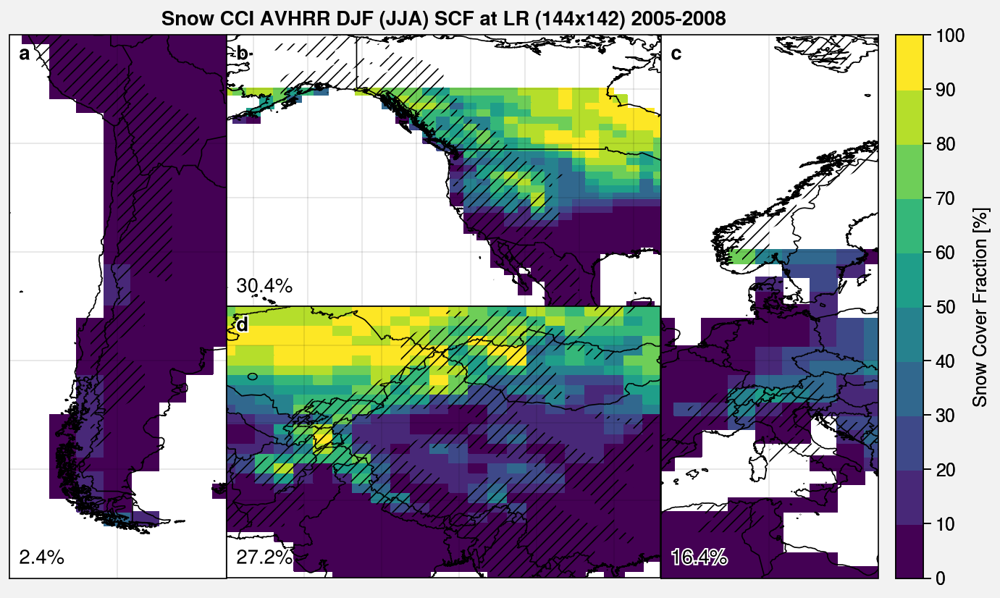

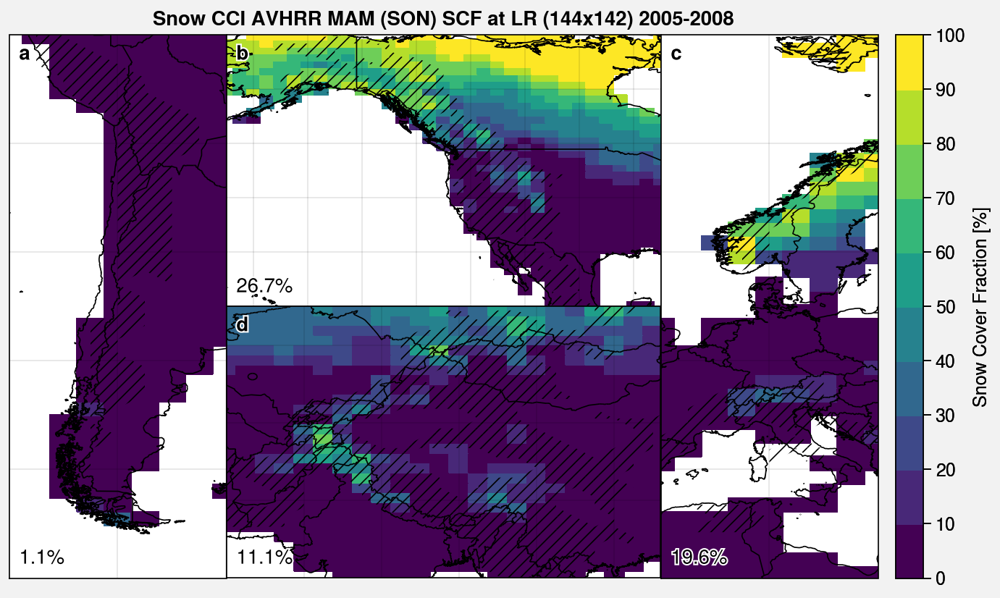

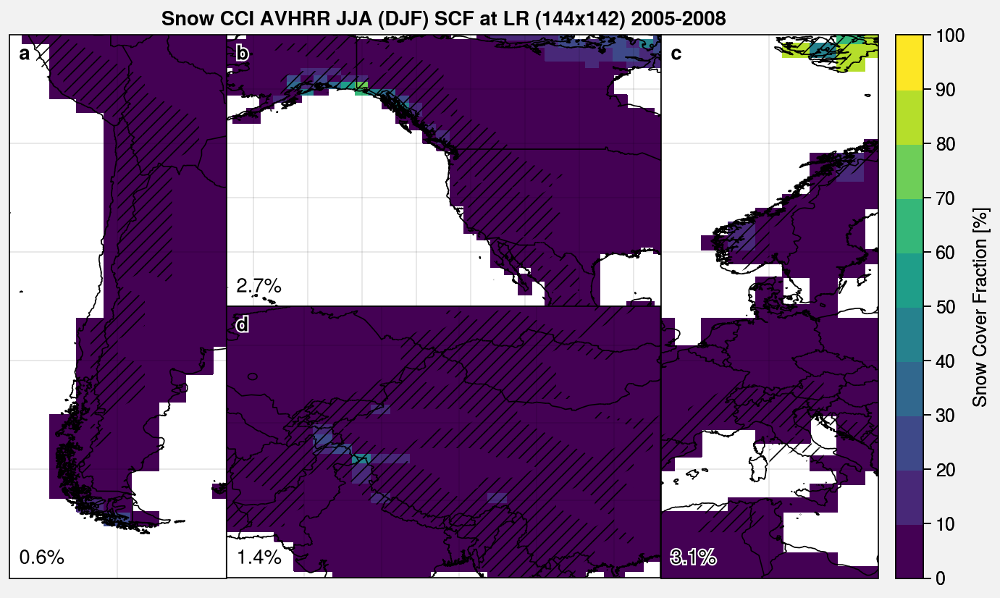

In [32]:
seasons = ['SON', 'DJF', 'MAM', 'JJA']
seasons_SA = ['MAM', 'JJA', 'SON', 'DJF']

cmap = 'viridis'
levels = plot.arange(0, 100, 10)

threshold = 200 # STD

for i_season, season in enumerate(seasons):
    fig, axs = plot.subplots([[1, 2, 2, 3], [1, 4, 4, 3]], proj='cyl', space=0, axwidth=1.5)
    
    # Take winter for NH and SH
    da = snc_AVHRR_1deg_regrid_seas.sel(season=season)
    da_SA = snc_AVHRR_1deg_regrid_seas.sel(season=seasons_SA[i_season])
    
    if season in ['SON', 'DJF']:
        da = da.where(da.lat < 60)

    for i, (latlim, lonlim) in enumerate(zip([latlim_SA, latlim_US, latlim_EU, latlim_HMA], [lonlim_SA, lonlim_US, lonlim_EU, lonlim_HMA])):
        if i == 0: # take oposite season for SH
            obs = da_SA.sel(lat=latlim, lon=lonlim)
        else:
            obs = da.sel(lat=latlim, lon=lonlim)
            
        m = axs[i].pcolormesh(obs, cmap=cmap, levels=levels)
        mean = (u.spatial_average(obs.where(std_LR_regrid > threshold))).values.item(0)
        axs[i].format(
            latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
            lltitle='{:.1f}%'.format(mean)
        )


    fig.colorbar(m, label='Snow Cover Fraction [%]', ticks=10)

    for ax in axs:
        ax.contourf(std_LR_regrid.where(std_LR_regrid > threshold), hatches=['////'], alpha=0)

    axs.format(
        lonlines=10, latlines=10,
        suptitle='Snow CCI AVHRR '+season+' ('+seasons_SA[i_season]+') SCF at LR (144x142) '+str(period.start)+'-'+str(period.stop),
        coast=True, borders=True,
    #     ocean=True, oceancolor='pale blue',
        abc=True, abcloc='ul', reso='hi'
    )

    # fig.save('img/snowCCI_MODIS_annual_coverage_'+str(pd.to_datetime(period.start))[:10]+'_'+str(ds.time[-1].values)[:10]+'.jpg')

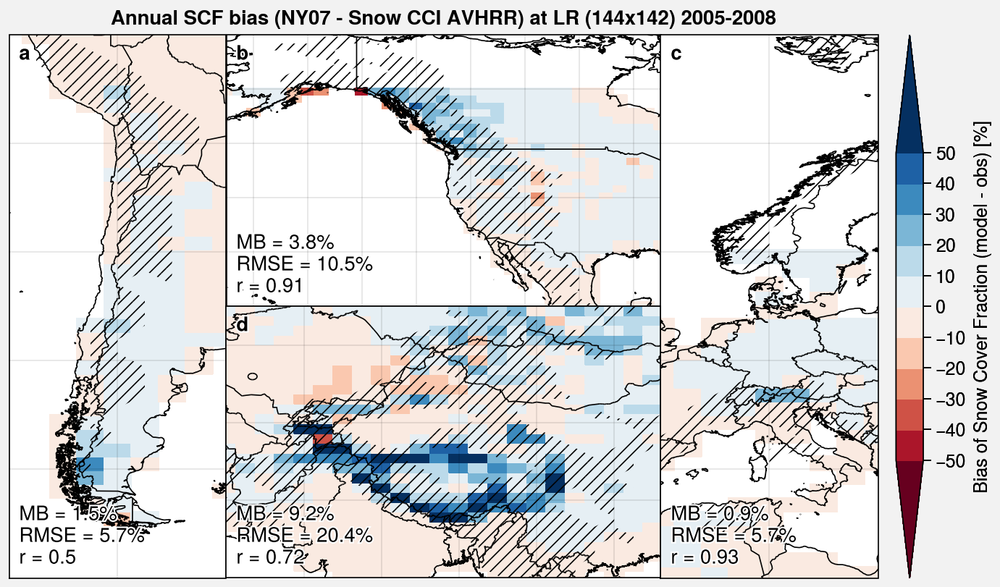

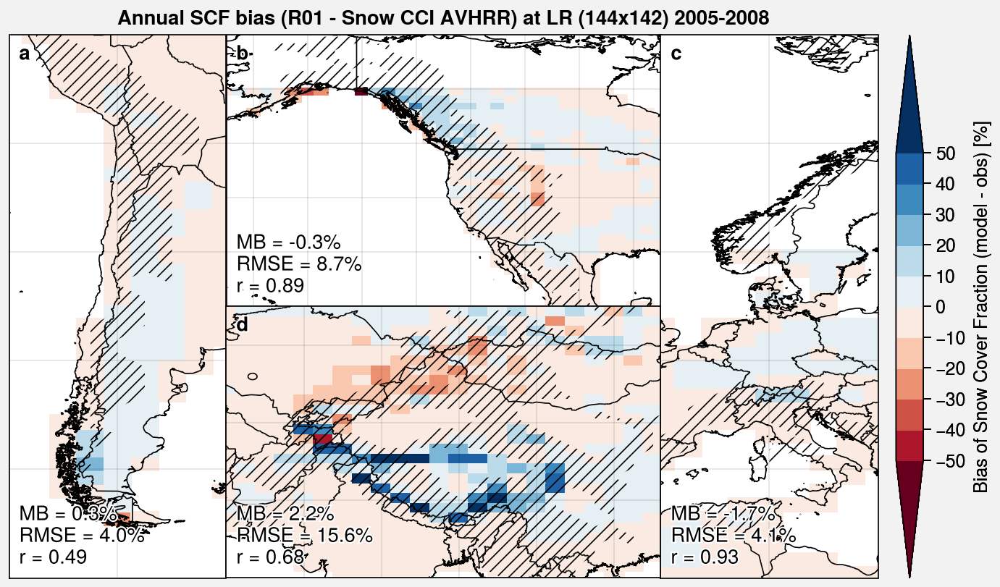

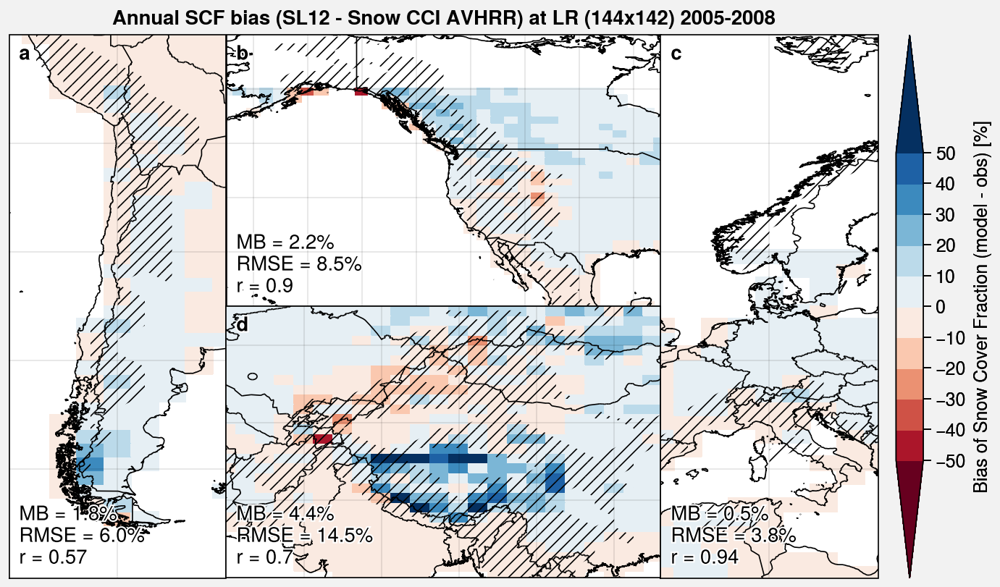

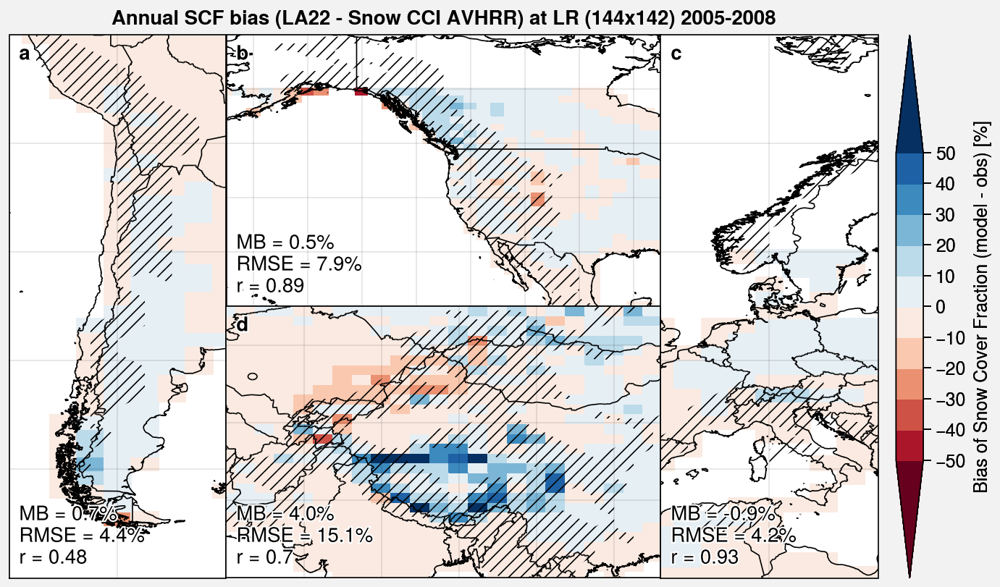

In [33]:
params = ['NY07', 'R01', 'SL12', 'LA22']
for param in params:

    fig, axs = plot.subplots([[1, 2, 2, 3], [1, 4, 4, 3]], proj='cyl', space=0, axwidth=1.5)

    obs = snc_AVHRR_1deg_regrid_seas.mean('season').where(snc_AVHRR_1deg_regrid_seas.lat < 60)
    model = ds_scf_params[param].mean('season').where(snc_AVHRR_1deg_regrid_seas.lat < 60)

    cmap = 'RdBu'
    levels = plot.arange(-50, 50, 10)
    extend = 'both'

    threshold = 200 # STD

    for i, (latlim, lonlim) in enumerate(zip([latlim_SA, latlim_US, latlim_EU, latlim_HMA], [lonlim_SA, lonlim_US, lonlim_EU, lonlim_HMA])):
        obs_subset = obs.sel(lat=latlim, lon=lonlim)
        model_subset = model.sel(lat=latlim, lon=lonlim)

        m = axs[i].pcolormesh(model_subset - obs_subset, cmap=cmap, levels=levels, extend=extend)
        mb, rmse, (r, _) = compute_metrics(model_subset.where(std_LR_regrid > threshold), obs_subset.where(std_LR_regrid > threshold))
        axs[i].format(
            latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
            lltitle='MB = {:.1f}%'.format(mb)+'\nRMSE = {:.1f}%'.format(rmse)+'\nr = {:.2}'.format(r)
        )


    fig.colorbar(m, label='Bias of Snow Cover Fraction (model - obs) [%]', ticks=10)

    for ax in axs:
        ax.contourf(std_LR_regrid.where(std_LR_regrid > threshold), hatches=['////'], alpha=0)

    axs.format(
        lonlines=10, latlines=10,
        suptitle='Annual SCF bias ('+param+' - Snow CCI AVHRR) at LR (144x142) '+str(period.start)+'-'+str(period.stop),
        coast=True, borders=True,
    #     ocean=True, oceancolor='pale blue',
        abc=True, abcloc='ul', reso='hi'
    )

    # fig.save('img/snowCCI_MODIS_annual_coverage_'+str(pd.to_datetime(period.start))[:10]+'_'+str(ds.time[-1].values)[:10]+'.jpg')

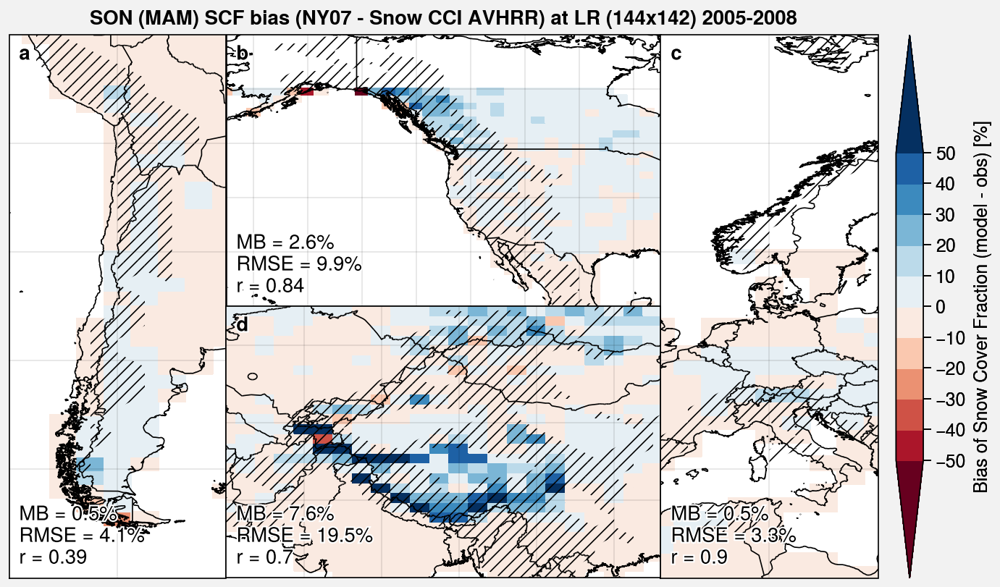

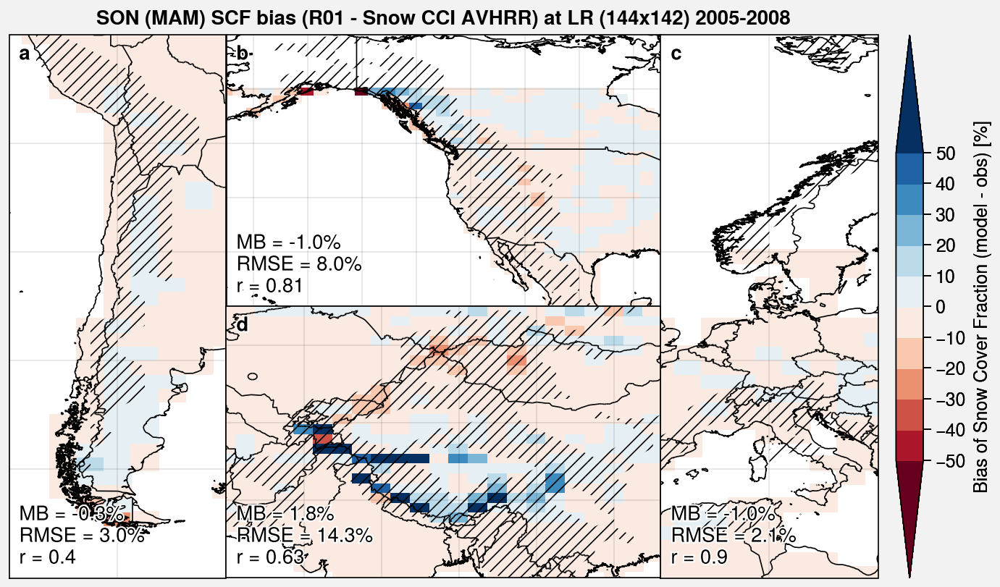

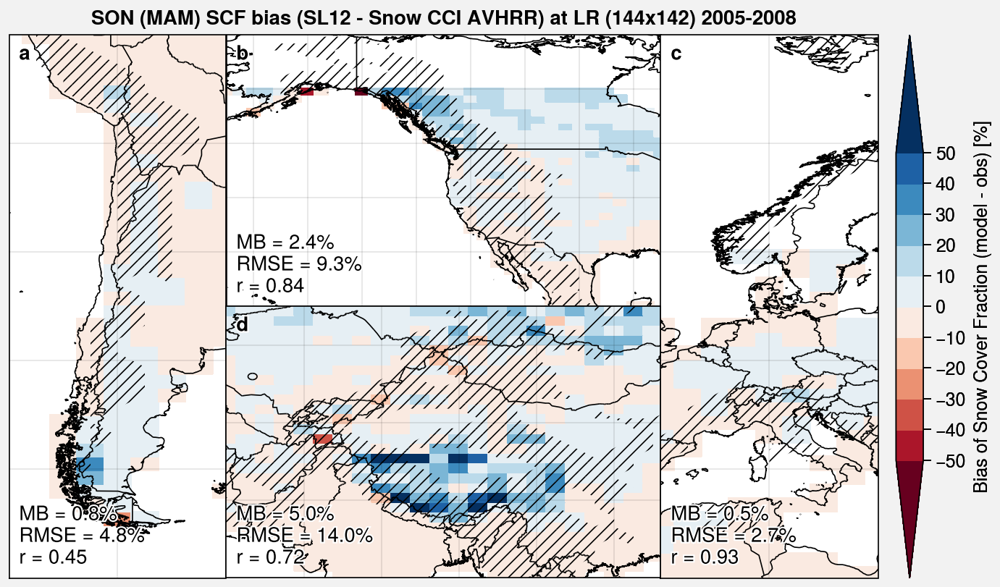

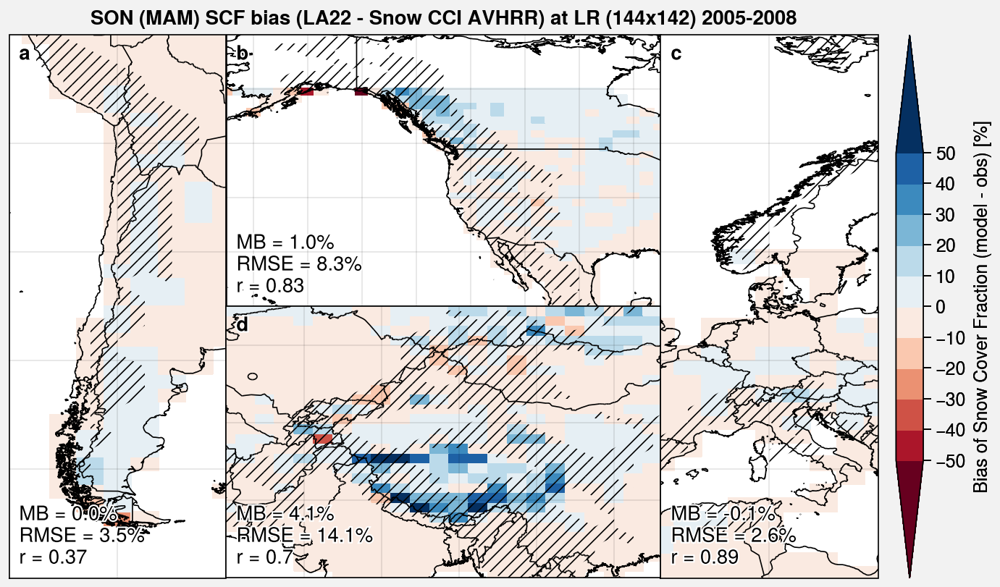

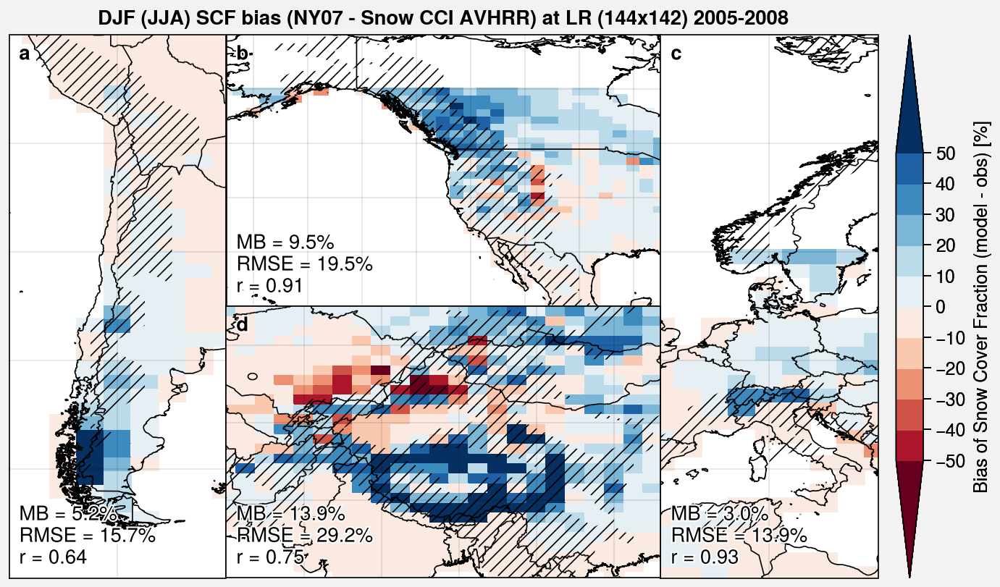

...

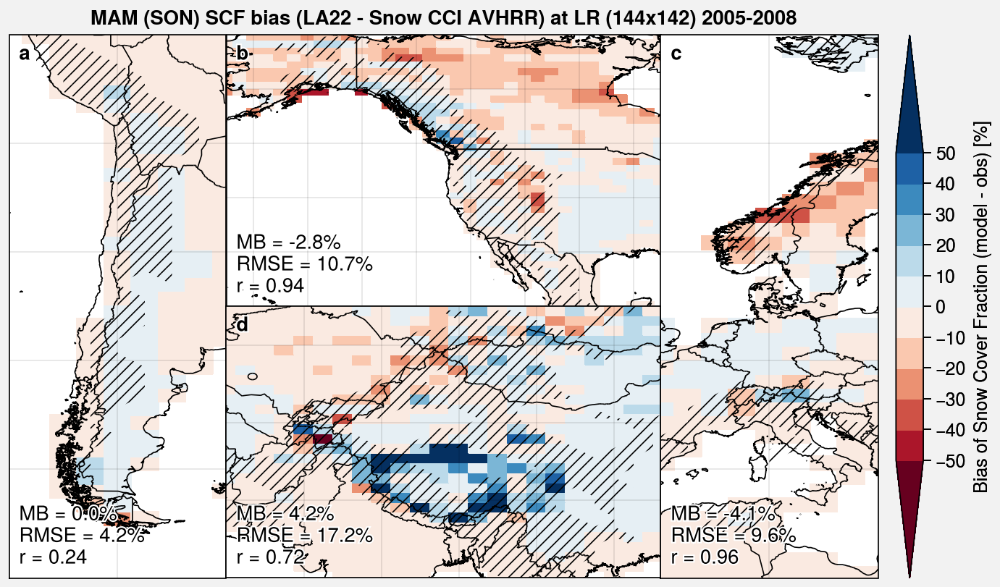

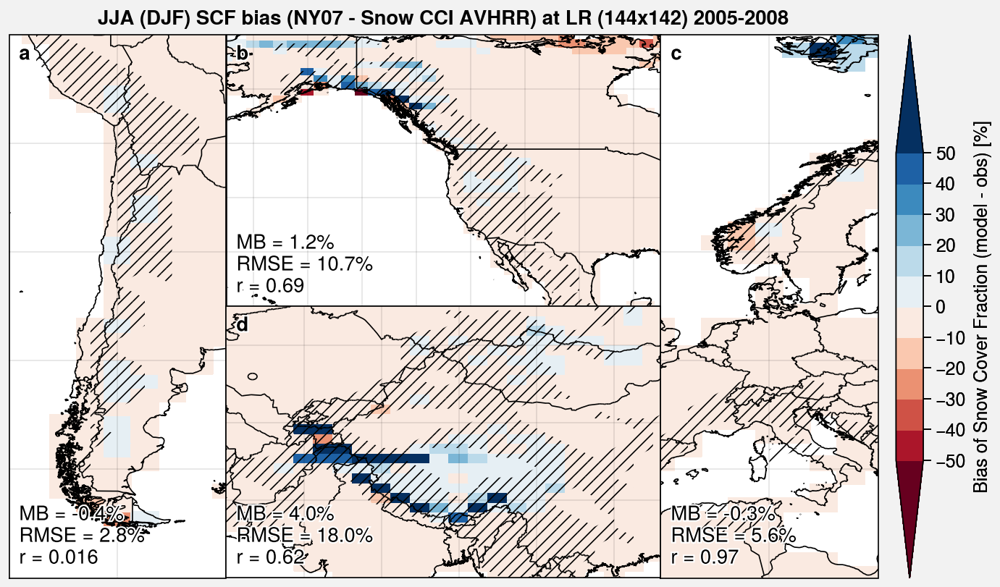

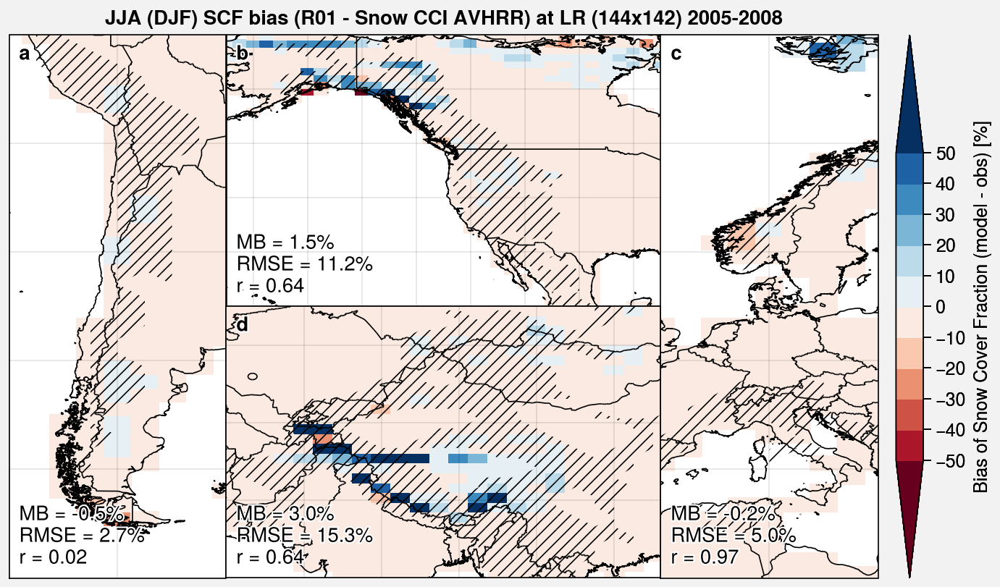

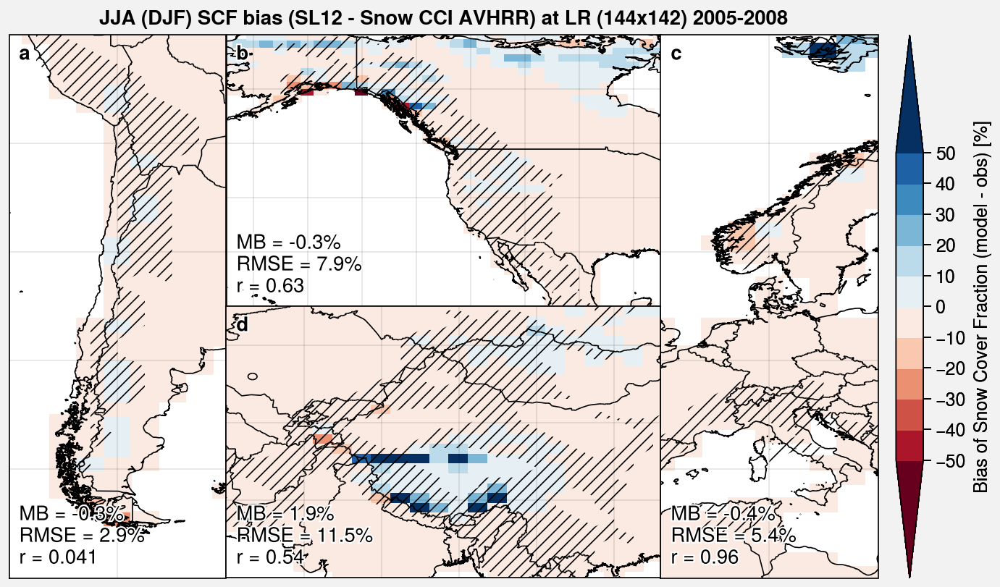

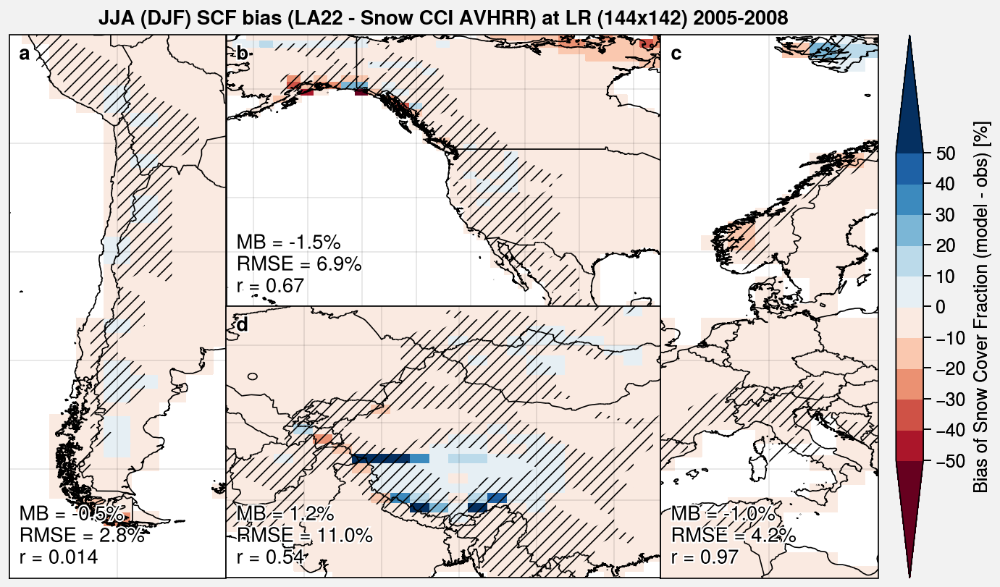

In [34]:
params = ['NY07', 'R01', 'SL12', 'LA22']

seasons = ['SON', 'DJF', 'MAM', 'JJA']
seasons_SA = ['MAM', 'JJA', 'SON', 'DJF']

cmap = 'RdBu'
levels = plot.arange(-50, 50, 10)
extend = 'both'

threshold = 200 # STD

for i_season, season in enumerate(seasons):
    for param in params:

        fig, axs = plot.subplots([[1, 2, 2, 3], [1, 4, 4, 3]], proj='cyl', space=0, axwidth=1.5)

        obs = snc_AVHRR_1deg_regrid_seas.sel(season=season)
        model = ds_scf_params[param].sel(season=season)
        
        obs_SA = snc_AVHRR_1deg_regrid_seas.sel(season=seasons_SA[i_season])
        model_SA = ds_scf_params[param].sel(season=seasons_SA[i_season])
        
        if season in ['SON', 'DJF']:
            obs = obs.where(obs.lat < 60)
            model = model.where(model.lat < 60)

        for i, (latlim, lonlim) in enumerate(zip([latlim_SA, latlim_US, latlim_EU, latlim_HMA], [lonlim_SA, lonlim_US, lonlim_EU, lonlim_HMA])):
            if i == 0: # take oposite season for SH
                obs_subset = obs_SA.sel(lat=latlim, lon=lonlim)
                model_subset = model_SA.sel(lat=latlim, lon=lonlim)
            else:
                obs_subset = obs.sel(lat=latlim, lon=lonlim)
                model_subset = model.sel(lat=latlim, lon=lonlim)

            m = axs[i].pcolormesh(model_subset - obs_subset, cmap=cmap, levels=levels, extend=extend)
            mb, rmse, (r, _) = compute_metrics(model_subset.where(std_LR_regrid > threshold), obs_subset.where(std_LR_regrid > threshold))
            axs[i].format(
                latlim=(latlim.start, latlim.stop), lonlim=(lonlim.start, lonlim.stop),
                lltitle='MB = {:.1f}%'.format(mb)+'\nRMSE = {:.1f}%'.format(rmse)+'\nr = {:.2}'.format(r)
            )


        fig.colorbar(m, label='Bias of Snow Cover Fraction (model - obs) [%]', ticks=10)

        for ax in axs:
            ax.contourf(std_LR_regrid.where(std_LR_regrid > threshold), hatches=['////'], alpha=0)

        axs.format(
            lonlines=10, latlines=10,
            suptitle=season+' ('+seasons_SA[i_season]+') SCF bias ('+param+' - Snow CCI AVHRR) at LR (144x142) '+str(period.start)+'-'+str(period.stop),
            coast=True, borders=True,
        #     ocean=True, oceancolor='pale blue',
            abc=True, abcloc='ul', reso='hi'
        )

        # fig.save('img/snowCCI_MODIS_annual_coverage_'+str(pd.to_datetime(period.start))[:10]+'_'+str(ds.time[-1].values)[:10]+'.jpg')